<a href="https://colab.research.google.com/github/samtbeardsley/Food_Porn/blob/master/03_Modeling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -q -U keras-tuner
import kerastuner as kt

In [ ]:
import numpy as np
import pandas as pd
import os
from skimage import io
from skimage import color
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.inception_v3 import InceptionV3
from keras.callbacks import EarlyStopping
from keras import layers
from keras import models
from keras.models import load_model
from sklearn.metrics import roc_curve, roc_auc_score, precision_recall_curve, auc
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

# Preparing Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data_dir = 'drive/My Drive/FoodPorn/Images'

batch_size = 32
img_height = 224
img_width = 224

In [ ]:
image_count = 41537
seed = 23

list_ds = tf.data.Dataset.list_files(f'{data_dir}/*/*', shuffle=False)
list_ds = list_ds.shuffle(image_count, seed=seed, reshuffle_each_iteration=False)

In [ ]:
train_size = 4500
val_size = 1000
test_size = 1000

# hyper parameter selection datasets
dataset = list_ds.take(train_size + val_size)
train_ds = dataset.take(train_size) 
val_ds = dataset.skip(train_size)

# final model training dataset
full_ds = list_ds.skip(train_size + val_size)
full_ds = full_ds.take(8500)
full_train_ds = full_ds.concatenate(train_ds)

# final model test dataset
test_ds = list_ds.skip(len(full_train_ds))
test_ds = test_ds.take(test_size)

In [ ]:
def get_label(file_path):
  # convert the path to a list of path components
  parts = tf.strings.split(file_path, os.path.sep)
  # The second to last is the class-directory
  one_hot = parts[-2] == class_names
  # Integer encode the label
  return tf.argmax(one_hot)

def decode_img(img):
  # convert the compressed string to a 3D uint8 tensor
  img = tf.image.decode_jpeg(img, channels=3)
  # resize the image to the desired size
  return tf.image.resize(img, [img_height, img_width])

def process_path(file_path):
  label = get_label(file_path)
  # load the raw data from the file as a string
  img = tf.io.read_file(file_path)
  img = decode_img(img)
  return img, label

In [ ]:
class_names = ['FP', 'SFP']

AUTOTUNE = tf.data.experimental.AUTOTUNE

train_dataset = train_ds.map(process_path, num_parallel_calls=AUTOTUNE)
val_dataset = val_ds.map(process_path, num_parallel_calls=AUTOTUNE)
test_dataset = test_ds.map(process_path, num_parallel_calls=AUTOTUNE)
full_train_ds = full_train_ds.map(process_path, num_parallel_calls=AUTOTUNE)

In [ ]:
def configure_for_performance(ds, shuffle=True):
  ds = ds.cache()
  ds = ds.batch(batch_size)
  ds = ds.prefetch(buffer_size=AUTOTUNE)
  if shuffle == True:
    ds = ds.shuffle(buffer_size=1000)
  return ds

train_dataset = configure_for_performance(train_dataset)
val_dataset = configure_for_performance(val_dataset, shuffle = False)
test_dataset = configure_for_performance(test_dataset, shuffle = False)
full_train_ds = configure_for_performance(full_train_ds)

Inspect dataset and confirm labels. FP should be 0 and SFP should be 1.

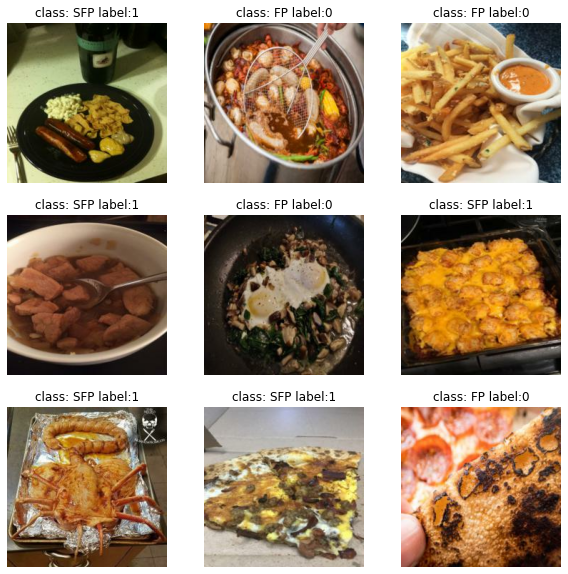

In [ ]:
image_batch, label_batch = next(iter(train_dataset))

plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(image_batch[i].numpy().astype("uint8"))
  label = label_batch[i]
  plt.title(f'class: {class_names[label]} label:{label}')
  plt.axis("off")

# Model Selection

I'll use transfer learning to test three pretrained models: ResNet50, VGG16, and InceptionV3 versus a baseline model that I build. As part of the model selection I'll use [Keras Tuner's](https://www.tensorflow.org/tutorials/keras/keras_tuner) Hyperband algorithm to find the best dropout rate and learning rate for these models. Then, train for 100 epochs with early stoping using a patience of 10 epochs monitoring validation loss. This will train on 4,500 images.

In [ ]:
def plot_acc_loss(model_history):
  """ plot training and validation accuracy figure 1
  plot training and validation cross entropy loss figure 2"""
  acc = model_history.history['accuracy']
  val_acc = model_history.history['val_accuracy']

  loss = model_history.history['loss']
  val_loss = model_history.history['val_loss']

  plt.figure(figsize=(8, 8))
  plt.subplot(2, 1, 1)
  plt.plot(acc, label='Training Accuracy')
  plt.plot(val_acc, label='Validation Accuracy')
  plt.legend(loc='best')
  plt.ylabel('Accuracy')
  plt.ylim([min(plt.ylim()),1])
  plt.xticks(np.arange(0,len(acc)+1,5))
  plt.title('Training and Validation Accuracy')

  plt.subplot(2, 1, 2)
  plt.plot(loss, label='Training Loss')
  plt.plot(val_loss, label='Validation Loss')
  plt.legend(loc='best')
  plt.ylabel('Cross Entropy')
  plt.ylim([0,max(plt.ylim())])
  plt.title('Training and Validation Loss')
  plt.xlabel('epoch')
  plt.xticks(np.arange(0,len(loss)+1,5))
  plt.show()

## Baseline Model

### Hyperband Trial

In [ ]:
def create_baseline_model(hp):
  inputs = keras.Input(shape=(224, 224, 3))

  # rescale to range [0,1]
  x = keras.layers.experimental.preprocessing.Rescaling(1./255)(inputs)

  # create layers
  x = keras.layers.Conv2D(64, kernel_size=3, activation='relu')(x)
  x = keras.layers.MaxPooling2D()(x)
  x = keras.layers.Conv2D(64, kernel_size=3, activation='relu')(x)
  x = keras.layers.MaxPooling2D()(x)
  x = keras.layers.Conv2D(32, kernel_size=3, activation='relu')(x)
  x = keras.layers.GlobalAveragePooling2D()(x)
  x = keras.layers.Flatten()(x)
  x = keras.layers.Dense(10)(x)  
  
  # Choose an optimal values from 0.0, to 0.5 in increments of 0.1
  hp_dropout = hp.Float('dropout', 0, 0.5, step=0.1, default=0.5)
  x = keras.layers.Dropout(hp_dropout)(x)

  # classification layer
  outputs = keras.layers.Dense(1, activation='sigmoid')(x)

  baseline_model = keras.Model(inputs, outputs)

  # Tune the learning rate for the optimizer 
  # Choose an optimal value from 0.1, 0.01, 0.001, or 0.0001
  hp_learning_rate = hp.Choice('learning_rate', values = [1e-1, 1e-2, 1e-3, 1e-4])
  baseline_model.compile(optimizer=keras.optimizers.Adam(hp_learning_rate),
                loss=keras.losses.BinaryCrossentropy(),
                metrics=['accuracy'])
  
  return baseline_model

In [ ]:
baseline_tuner = kt.Hyperband(
    create_baseline_model,
    objective='val_accuracy',
    max_epochs=10,
    seed=23,
    hyperband_iterations=2,
    directory= '',
    project_name='baseline_hyperband_trial',
    overwrite=True)

baseline_tuner.search(train_dataset,
             validation_data=val_dataset,
             epochs=10,
             callbacks=[tf.keras.callbacks.EarlyStopping(patience=3)])

Trial 30 Complete [00h 00m 59s]
val_accuracy: 0.7310000061988831

Best val_accuracy So Far: 0.7379999756813049
Total elapsed time: 00h 11m 06s
INFO:tensorflow:Oracle triggered exit


In [ ]:
baseline_tuner.results_summary()

Results summary
Results in ./baseline_hyperband_trial
Showing 10 best trials
Objective(name='val_accuracy', direction='max')
Trial summary
Hyperparameters:
dropout: 0.1
learning_rate: 0.001
tuner/epochs: 10
tuner/initial_epoch: 4
tuner/bracket: 2
tuner/round: 2
tuner/trial_id: 2c4e303f4ca4eb0580b36854bbfc40ac
Score: 0.7379999756813049
Trial summary
Hyperparameters:
dropout: 0.0
learning_rate: 0.001
tuner/epochs: 10
tuner/initial_epoch: 0
tuner/bracket: 0
tuner/round: 0
Score: 0.7310000061988831
Trial summary
Hyperparameters:
dropout: 0.30000000000000004
learning_rate: 0.001
tuner/epochs: 10
tuner/initial_epoch: 4
tuner/bracket: 2
tuner/round: 2
tuner/trial_id: 27cd45809bf6e4800570f8275530edff
Score: 0.718999981880188
Trial summary
Hyperparameters:
dropout: 0.4
learning_rate: 0.001
tuner/epochs: 10
tuner/initial_epoch: 4
tuner/bracket: 1
tuner/round: 1
tuner/trial_id: d899b61dfbf2df8aae71bdeab6466aab
Score: 0.7160000205039978
Trial summary
Hyperparameters:
dropout: 0.4
learning_rate: 0.

### Training

In [ ]:
inputs = keras.Input(shape=(224, 224, 3))

# rescale to range [0,1]
x = keras.layers.experimental.preprocessing.Rescaling(1./255)(inputs)

# create layers
x = keras.layers.Conv2D(64, kernel_size=3, activation='relu')(x)
x = keras.layers.MaxPooling2D()(x)
x = keras.layers.Conv2D(64, kernel_size=3, activation='relu')(x)
x = keras.layers.MaxPooling2D()(x)
x = keras.layers.Conv2D(32, kernel_size=3, activation='relu')(x)
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Flatten()(x)

x = keras.layers.Dense(10)(x)  
x = keras.layers.Dropout(0.1)(x) # best dropout

# classification layer
outputs = keras.layers.Dense(1, activation='sigmoid')(x)

base_model = keras.Model(inputs, outputs)

base_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), #best learning rate
                loss=keras.losses.BinaryCrossentropy(),
                metrics=['accuracy'])

base_model.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
rescaling (Rescaling)        (None, 224, 224, 3)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 222, 222, 64)      1792      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 111, 111, 64)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 109, 109, 64)      36928     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 54, 54, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 52, 52, 32)       

In [ ]:
initial_epochs = 100

# stop training if val accuracy does not improve after 10 epochs
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss',  patience=10)
# save best model with lowest loss
checkpoint_path = 'drive/My Drive/FoodPorn/Models/baseline_selection.h5'
mc =  keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_loss', verbose=1, save_best_only=True)

history = base_model.fit(train_dataset,
                     epochs=initial_epochs,
                     validation_data=val_dataset,
                     callbacks=[early_stop, mc])

Epoch 1/100
141/141 [==============================] - ETA: 0s - loss: 0.6791 - accuracy: 0.5651
Epoch 00001: val_loss improved from inf to 0.64274, saving model to drive/My Drive/FoodPorn/Models/base_model.h5
141/141 [==============================] - 7s 49ms/step - loss: 0.6791 - accuracy: 0.5651 - val_loss: 0.6427 - val_accuracy: 0.6130
Epoch 2/100
141/141 [==============================] - ETA: 0s - loss: 0.6478 - accuracy: 0.6240
Epoch 00002: val_loss improved from 0.64274 to 0.62627, saving model to drive/My Drive/FoodPorn/Models/base_model.h5
141/141 [==============================] - 5s 36ms/step - loss: 0.6478 - accuracy: 0.6240 - val_loss: 0.6263 - val_accuracy: 0.6490
Epoch 3/100
141/141 [==============================] - ETA: 0s - loss: 0.6340 - accuracy: 0.6453
Epoch 00003: val_loss improved from 0.62627 to 0.59066, saving model to drive/My Drive/FoodPorn/Models/base_model.h5
141/141 [==============================] - 5s 36ms/step - loss: 0.6340 - accuracy: 0.6453 - val_lo

In [ ]:
hist_df = pd.DataFrame(history.history)
hist_df.to_csv('drive/My Drive/FoodPorn/Models/baseline_seleciton_history.csv')

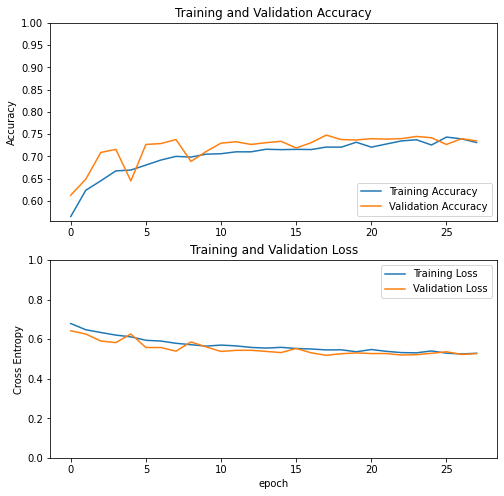

In [ ]:
plot_acc_loss(history)

## VGG16

### Hyperband Trial

In [ ]:
base_vgg = VGG16(weights='imagenet', include_top=False, input_shape=(224,224,3))
base_vgg.trainable = False

In [ ]:
def create_vgg(hp):
  inputs = keras.Input(shape=(224, 224, 3))
  
  # rescale to range [0,1]
  x = keras.layers.experimental.preprocessing.Rescaling(1./255)(inputs)

  # create base model & fix weights
  x = base_vgg(x, training=False)

  # create trainable layers
  x = keras.layers.GlobalAveragePooling2D()(x)
  
  # Tune the dropout rate
  # Choose an optimal values from 0.0, to 0.5 in increments of 0.1
  hp_dropout = hp.Float('dropout', 0, 0.5, step=0.1, default=0.5)
  x = keras.layers.Dropout(hp_dropout)(x)
  outputs = keras.layers.Dense(1, activation='sigmoid')(x)

  VGG16_model = keras.Model(inputs, outputs)

  # Tune the learning rate for the optimizer 
  # Choose an optimal value from 0.1, 0.01, 0.001, or 0.0001
  hp_learning_rate = hp.Choice('learning_rate', values = [1e-1, 1e-2, 1e-3, 1e-4]) 


  VGG16_model.compile(optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
                loss=keras.losses.BinaryCrossentropy(),
                metrics=['accuracy'])

  return VGG16_model

In [ ]:
vgg_tuner = kt.Hyperband(
    create_vgg,
    objective='val_accuracy',
    max_epochs=10,
    seed=23,
    hyperband_iterations=2,
    directory= 'drive/My Drive/FoodPorn/Hyperband',
    project_name='vgg_hyperband_trial',
    overwrite=True)

vgg_tuner.search(train_dataset,
             validation_data=val_dataset,
             epochs=10,
             callbacks=[tf.keras.callbacks.EarlyStopping(patience=3)])

Trial 30 Complete [00h 01m 17s]
val_accuracy: 0.7720000147819519

Best val_accuracy So Far: 0.7770000100135803
Total elapsed time: 00h 26m 53s
INFO:tensorflow:Oracle triggered exit


In [ ]:
vgg_tuner.results_summary()

Results summary
Results in drive/My Drive/FoodPorn/Hyperband/vgg_hyperband_trial
Showing 10 best trials
Objective(name='val_accuracy', direction='max')
Trial summary
Hyperparameters:
dropout: 0.30000000000000004
learning_rate: 0.01
tuner/epochs: 10
tuner/initial_epoch: 4
tuner/bracket: 1
tuner/round: 1
tuner/trial_id: 6b8ca2f8c316f0ebd5b9b07307938286
Score: 0.7770000100135803
Trial summary
Hyperparameters:
dropout: 0.1
learning_rate: 0.01
tuner/epochs: 10
tuner/initial_epoch: 0
tuner/bracket: 0
tuner/round: 0
Score: 0.7770000100135803
Trial summary
Hyperparameters:
dropout: 0.30000000000000004
learning_rate: 0.01
tuner/epochs: 4
tuner/initial_epoch: 0
tuner/bracket: 1
tuner/round: 0
Score: 0.7749999761581421
Trial summary
Hyperparameters:
dropout: 0.1
learning_rate: 0.1
tuner/epochs: 10
tuner/initial_epoch: 4
tuner/bracket: 2
tuner/round: 2
tuner/trial_id: 812c53e3cd104eb18b1a982859c27c1c
Score: 0.7739999890327454
Trial summary
Hyperparameters:
dropout: 0.0
learning_rate: 0.001
tuner/e

### Training

In [ ]:
inputs = keras.Input(shape=(224, 224, 3))
  
# rescale to range [0,1]
x = keras.layers.experimental.preprocessing.Rescaling(1./255)(inputs)

# create base model & fix weights
x = base_vgg(x, training=False)

# create trainable layers
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dropout(0.3)(x) # best dropout

outputs = keras.layers.Dense(1, activation='sigmoid')(x)

vgg16_model = keras.Model(inputs, outputs)

vgg16_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.01), # best learning rate
                loss=keras.losses.BinaryCrossentropy(),
                metrics=['accuracy'])

In [ ]:
initial_epochs = 100

# stop training if val accuracy does not improve after 10 epochs
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss',  patience=10)
# save best model with lowest loss
checkpoint_path = 'drive/My Drive/FoodPorn/Models/vgg_selection.h5'
mc =  keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_loss', verbose=1, save_best_only=True)

history = vgg16_model.fit(train_dataset,
                     epochs=initial_epochs,
                     validation_data=val_dataset,
                     callbacks=[early_stop, mc])

Epoch 1/100
141/141 [==============================] - ETA: 0s - loss: 0.5995 - accuracy: 0.6762
Epoch 00001: val_loss improved from inf to 0.52454, saving model to drive/My Drive/FoodPorn/Models/vgg.h5
141/141 [==============================] - 12s 85ms/step - loss: 0.5995 - accuracy: 0.6762 - val_loss: 0.5245 - val_accuracy: 0.7470
Epoch 2/100
141/141 [==============================] - ETA: 0s - loss: 0.5517 - accuracy: 0.7196
Epoch 00002: val_loss improved from 0.52454 to 0.50672, saving model to drive/My Drive/FoodPorn/Models/vgg.h5
141/141 [==============================] - 11s 79ms/step - loss: 0.5517 - accuracy: 0.7196 - val_loss: 0.5067 - val_accuracy: 0.7640
Epoch 3/100
141/141 [==============================] - ETA: 0s - loss: 0.5400 - accuracy: 0.7196
Epoch 00003: val_loss did not improve from 0.50672
141/141 [==============================] - 11s 77ms/step - loss: 0.5400 - accuracy: 0.7196 - val_loss: 0.5071 - val_accuracy: 0.7590
Epoch 4/100
141/141 [======================

In [ ]:
hist_df = pd.DataFrame(history.history)
hist_df.to_csv('drive/My Drive/FoodPorn/Models/vgg_selection_history.csv')

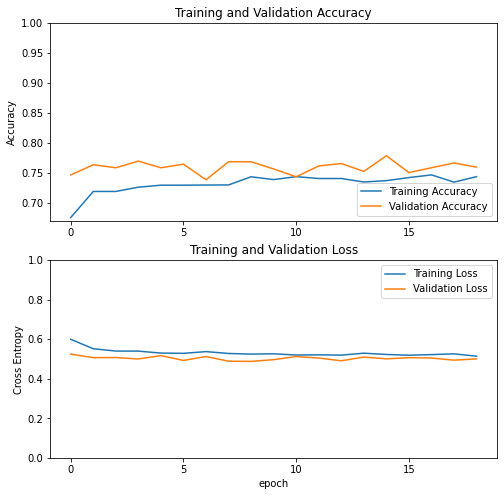

In [ ]:
plot_acc_loss(history)

## ResNet50

### Hyperband Trial

In [ ]:
base_resnet = ResNet50(weights='imagenet', include_top=False, input_shape=(224,224,3))
base_resnet.trainable = False

94773248/94765736 [==============================] - 1s 0us/step


In [ ]:
def create_resnet(hp):
  inputs = keras.Input(shape=(224, 224, 3))

  # rescale to range [0,1]
  x = keras.layers.experimental.preprocessing.Rescaling(1./255)(inputs)

  # create base model & fix weights
  x = base_resnet(inputs, training=False)

  # create trainable layers
  x = keras.layers.GlobalAveragePooling2D()(x)
  # Tune the dropout rate
  # Choose an optimal values from 0.1, 0.2, 0.3, 0.4, or 0.5
  hp_dropout = hp.Float('dropout', 0, 0.5, step=0.1, default=0.5)
  x = keras.layers.Dropout(hp_dropout)(x)  # Regularize with dropout
  
  outputs = keras.layers.Dense(1, activation='sigmoid')(x)

  ResNet50_model = keras.Model(inputs, outputs)

  # Tune the learning rate for the optimizer 
  # Choose an optimal value from 0.1, 0.01, 0.001, or 0.0001
  hp_learning_rate = hp.Choice('learning_rate', values = [1e-1, 1e-2, 1e-3, 1e-4]) 


  ResNet50_model.compile(optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
                loss=keras.losses.BinaryCrossentropy(),
                metrics=['accuracy'])

  return ResNet50_model

In [ ]:
resnet_tuner = kt.Hyperband(
    create_resnet,
    objective='val_accuracy',
    max_epochs=10,
    seed=23,
    hyperband_iterations=2,
    directory= 'drive/My Drive/FoodPorn/Hyperband',
    project_name='resnet_hyperband_trial',
    overwrite=True)

resnet_tuner.search(train_dataset,
             validation_data=val_dataset,
             epochs=10,
             callbacks=[tf.keras.callbacks.EarlyStopping(patience=3)])

Trial 30 Complete [00h 01m 14s]
val_accuracy: 0.8159999847412109

Best val_accuracy So Far: 0.8259999752044678
Total elapsed time: 00h 15m 26s
INFO:tensorflow:Oracle triggered exit


In [ ]:
resnet_tuner.results_summary()

Results summary
Results in drive/My Drive/FoodPorn/Hyperband/resnet_hyperband_trial
Showing 10 best trials
Objective(name='val_accuracy', direction='max')
Trial summary
Hyperparameters:
dropout: 0.4
learning_rate: 0.001
tuner/epochs: 4
tuner/initial_epoch: 0
tuner/bracket: 1
tuner/round: 0
Score: 0.8259999752044678
Trial summary
Hyperparameters:
dropout: 0.1
learning_rate: 0.001
tuner/epochs: 10
tuner/initial_epoch: 4
tuner/bracket: 2
tuner/round: 2
tuner/trial_id: b0a346854d262aa7c0b5edd3c536f035
Score: 0.8240000009536743
Trial summary
Hyperparameters:
dropout: 0.30000000000000004
learning_rate: 0.001
tuner/epochs: 10
tuner/initial_epoch: 4
tuner/bracket: 2
tuner/round: 2
tuner/trial_id: 21f28ee99bf0f6e81363b2b073c02cf1
Score: 0.8199999928474426
Trial summary
Hyperparameters:
dropout: 0.30000000000000004
learning_rate: 0.001
tuner/epochs: 4
tuner/initial_epoch: 2
tuner/bracket: 2
tuner/round: 1
tuner/trial_id: c079a098652d29b33e5a710838a2e384
Score: 0.8180000185966492
Trial summary
Hy

### Training

In [ ]:
inputs = keras.Input(shape=(224, 224, 3))
# rescale to range [0,1]
x = keras.layers.experimental.preprocessing.Rescaling(1./255)(inputs)

# create base model & fix weights
x = base_resnet(inputs, training=False)

# create trainable layers
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dropout(0.4)(x)  # best dropout
 
outputs = keras.layers.Dense(1, activation='sigmoid')(x)
resnet = keras.Model(inputs, outputs)

resnet.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), # best learning rate
                loss=keras.losses.BinaryCrossentropy(),
                metrics=['accuracy'])

In [ ]:
initial_epochs = 100

# stop training if val accuracy does not improve after 10 epochs
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss',  patience=10)
# save best model with lowest loss
checkpoint_path = 'drive/My Drive/FoodPorn/Models/resnet_selection.h5'
mc =  keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_loss', verbose=1, save_best_only=True)

history = resnet.fit(train_dataset,
                     epochs=initial_epochs,
                     validation_data=val_dataset,
                     callbacks=[early_stop, mc])

Epoch 1/100
141/141 [==============================] - ETA: 0s - loss: 0.6547 - accuracy: 0.6724
Epoch 00001: val_loss improved from inf to 0.47589, saving model to drive/My Drive/FoodPorn/Models/resnet_selection.h5
141/141 [==============================] - 11s 79ms/step - loss: 0.6547 - accuracy: 0.6724 - val_loss: 0.4759 - val_accuracy: 0.7840
Epoch 2/100
141/141 [==============================] - ETA: 0s - loss: 0.5160 - accuracy: 0.7622
Epoch 00002: val_loss improved from 0.47589 to 0.44574, saving model to drive/My Drive/FoodPorn/Models/resnet_selection.h5
141/141 [==============================] - 10s 73ms/step - loss: 0.5160 - accuracy: 0.7622 - val_loss: 0.4457 - val_accuracy: 0.7940
Epoch 3/100
141/141 [==============================] - ETA: 0s - loss: 0.4834 - accuracy: 0.7802
Epoch 00003: val_loss improved from 0.44574 to 0.43030, saving model to drive/My Drive/FoodPorn/Models/resnet_selection.h5
141/141 [==============================] - 10s 73ms/step - loss: 0.4834 - accu

In [ ]:
hist_df = pd.DataFrame(history.history)
hist_df.to_csv('drive/My Drive/FoodPorn/Models/resnet_selection_history.csv')

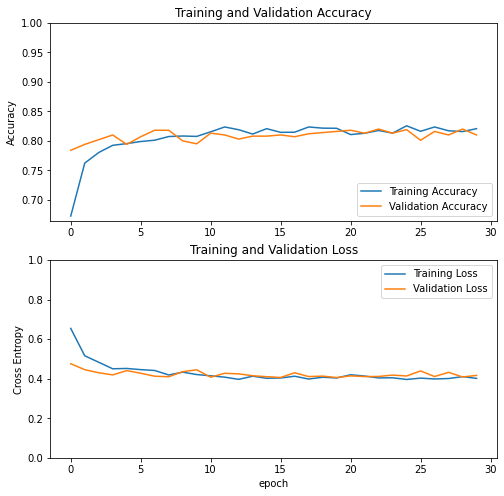

In [ ]:
plot_acc_loss(history)

## InceptionV3

### Hyperband Trial

In [ ]:
base_inception = InceptionV3(weights='imagenet', include_top=False, input_shape=(224,224,3))
base_inception.trainable = False

87916544/87910968 [==============================] - 1s 0us/step


In [ ]:
def create_inception(hp):
  inputs = keras.Input(shape=(224, 224, 3))

  # rescale to range [0,1]
  x = keras.layers.experimental.preprocessing.Rescaling(1./255)(inputs)

  # create base model & fix weights
  x = base_inception(inputs, training=False)

  # create trainable layers
  x = keras.layers.GlobalAveragePooling2D()(x) 
  # Tune the dropout rate
  # Choose an optimal values from 0.1, 0.2, 0.3, 0.4, or 0.5
  hp_dropout = hp.Float('dropout', 0, 0.5, step=0.1, default=0.5)
  x = keras.layers.Dropout(hp_dropout)(x)  # Regularize with dropout
  
  outputs = keras.layers.Dense(1, activation='sigmoid')(x)
  Inception_model = keras.Model(inputs, outputs)

  # Tune the learning rate for the optimizer 
  # Choose an optimal value from 0.1, 0.01, 0.001, or 0.0001
  hp_learning_rate = hp.Choice('learning_rate', values = [1e-1, 1e-2, 1e-3, 1e-4]) 


  Inception_model.compile(optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
                loss=keras.losses.BinaryCrossentropy(),
                metrics=['accuracy'])

  return Inception_model

In [ ]:
inception_tuner = kt.Hyperband(
    create_inception,
    objective='val_accuracy',
    max_epochs=10,
    seed=23,
    hyperband_iterations=2,
    directory= 'drive/My Drive/FoodPorn/Hyperband',
    project_name='inception_hyperband_trial',
    overwrite=True)

inception_tuner.search(train_dataset,
             validation_data=val_dataset,
             epochs=10,
             callbacks=[tf.keras.callbacks.EarlyStopping(patience=3)])

Trial 30 Complete [00h 01m 08s]
val_accuracy: 0.656000018119812

Best val_accuracy So Far: 0.6949999928474426
Total elapsed time: 00h 14m 35s
INFO:tensorflow:Oracle triggered exit


In [ ]:
inception_tuner.results_summary()

Results summary
Results in drive/My Drive/FoodPorn/Hyperband/inception_hyperband_trial
Showing 10 best trials
Objective(name='val_accuracy', direction='max')
Trial summary
Hyperparameters:
dropout: 0.4
learning_rate: 0.001
tuner/epochs: 10
tuner/initial_epoch: 4
tuner/bracket: 1
tuner/round: 1
tuner/trial_id: 9e585fc6b190478915c6d784bb3c33f1
Score: 0.6949999928474426
Trial summary
Hyperparameters:
dropout: 0.5
learning_rate: 0.1
tuner/epochs: 10
tuner/initial_epoch: 0
tuner/bracket: 0
tuner/round: 0
Score: 0.6800000071525574
Trial summary
Hyperparameters:
dropout: 0.5
learning_rate: 0.0001
tuner/epochs: 2
tuner/initial_epoch: 0
tuner/bracket: 2
tuner/round: 0
Score: 0.6769999861717224
Trial summary
Hyperparameters:
dropout: 0.4
learning_rate: 0.0001
tuner/epochs: 10
tuner/initial_epoch: 0
tuner/bracket: 0
tuner/round: 0
Score: 0.6759999990463257
Trial summary
Hyperparameters:
dropout: 0.2
learning_rate: 0.001
tuner/epochs: 2
tuner/initial_epoch: 0
tuner/bracket: 2
tuner/round: 0
Score:

### Training

In [ ]:
inputs = keras.Input(shape=(224, 224, 3))
# rescale to range [0,1]
x = keras.layers.experimental.preprocessing.Rescaling(1./255)(inputs)

# create base model & fix weights
x = base_inception(inputs, training=False)

# create trainable layers
x = keras.layers.GlobalAveragePooling2D()(x) 
x = keras.layers.Dropout(0.4)(x)  # best dropout
  
outputs = keras.layers.Dense(1, activation='sigmoid')(x)
inception = keras.Model(inputs, outputs)

inception.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), # best learning rate
                loss=keras.losses.BinaryCrossentropy(),
                metrics=['accuracy'])

In [ ]:
initial_epochs = 100

# stop training if val accuracy does not improve after 10 epochs
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss',  patience=10)
# save best model with lowest loss
checkpoint_path = 'drive/My Drive/FoodPorn/Models/inception_selection.h5'
mc =  keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_loss', verbose=1, save_best_only=True)

history = inception.fit(train_dataset,
                     epochs=initial_epochs,
                     validation_data=val_dataset,
                     callbacks=[early_stop, mc])

Epoch 1/100
141/141 [==============================] - ETA: 0s - loss: 6.8418 - accuracy: 0.5678
Epoch 00001: val_loss improved from inf to 3.95164, saving model to drive/My Drive/FoodPorn/Models/inception_selection.h5
141/141 [==============================] - 11s 76ms/step - loss: 6.8418 - accuracy: 0.5678 - val_loss: 3.9516 - val_accuracy: 0.5730
Epoch 2/100
140/141 [============================>.] - ETA: 0s - loss: 4.2896 - accuracy: 0.5815
Epoch 00002: val_loss improved from 3.95164 to 1.58860, saving model to drive/My Drive/FoodPorn/Models/inception_selection.h5
141/141 [==============================] - 9s 63ms/step - loss: 4.2873 - accuracy: 0.5813 - val_loss: 1.5886 - val_accuracy: 0.6260
Epoch 3/100
141/141 [==============================] - ETA: 0s - loss: 2.8136 - accuracy: 0.5858
Epoch 00003: val_loss improved from 1.58860 to 1.16336, saving model to drive/My Drive/FoodPorn/Models/inception_selection.h5
141/141 [==============================] - 9s 64ms/step - loss: 2.8136

In [ ]:
hist_df = pd.DataFrame(history.history)
hist_df.to_csv('drive/My Drive/FoodPorn/Models/inception_selection_history.csv')

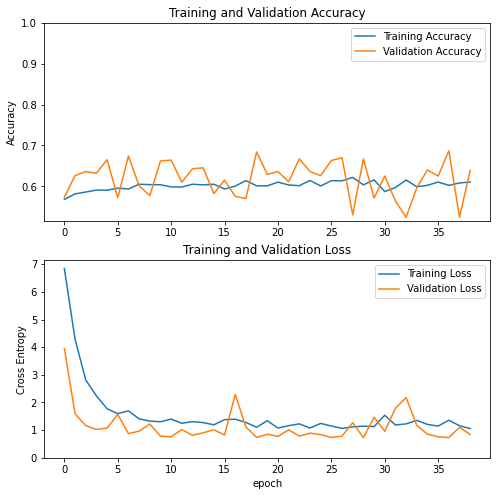

In [ ]:
plot_acc_loss(history)

## Results

After conducting the Hyperband trials the ResNet50 pretrained network performed the best with a 0.8160 validation accuracy.

#### Parameters Evaluated

| Parameter | Values |
| ---- | ---- |
| Dropout Rate | 0.0, 0.1, 0.2, 0.3, 0.4, 0.5 |
|Learning Rate | 0.1, 0.01, 0.001, 0.0001 |

#### Results

|  Network | Best Parameters | Validation Loss | Validation Accuracy |
| ---- | ---- | ---- | ---- |
| Baseline | Dropout: 0.01, Learning Rate: 0.01 | 0.5184 | 0.7480 |
| VGG16 | Dropout: 0.3, Learning Rate: 0.01 | 0.4877 | 0.7690 |
| ResNet50 | Dropout: 0.4, Learning Rate: 0.001 | 0.4060 | 0.8160 |
| InceptionV3 | Dropout: 0.4, Learning Rate: 0.001 | 0.7270 | 0.6670 |

# Transfer Learning

Now that I've selected the ResNet50 pretrained model and parameters, I'll train using the best hyperparameters with 13,000 images and allow for increased training time. Finally, I'll unfreeze the bottom layers to perform a fine tuning pass with a lower learning rate.

In [ ]:
base_resnet = ResNet50(weights='imagenet', include_top=False, input_shape=(224,224,3))
base_resnet.trainable = False

In [ ]:
inputs = keras.Input(shape=(224, 224, 3))

# rescale to range [0,1]
x = keras.layers.experimental.preprocessing.Rescaling(1./255)(inputs)

# create base model & fix weights
x = base_resnet(inputs, training=False)

# create trainable layers
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dropout(0.4)(x)  # Regularize with dropout
  
outputs = keras.layers.Dense(1, activation='sigmoid')(x)

resnet = keras.Model(inputs, outputs)

resnet.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
                loss=keras.losses.BinaryCrossentropy(),
                metrics=['accuracy'])

In [ ]:
resnet.summary()

Model: "functional_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
resnet50 (Functional)        (None, 7, 7, 2048)        23587712  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 2048)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 2049      
Total params: 23,589,761
Trainable params: 2,049
Non-trainable params: 23,587,712
_________________________________________________________________


## ResNet50 Training

In [ ]:
initial_epochs = 1000

# stop training if val accuracy does not improve after 20 epochs
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss',  patience=20)
# save best model with lowest loss
checkpoint_path = 'drive/My Drive/FoodPorn/Models/resnet.h5'
mc =  keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_loss', verbose=1, save_best_only=True)

history = resnet.fit(full_train_ds,
                     epochs=initial_epochs,
                     validation_data=val_dataset,
                     callbacks=[early_stop, mc])

Epoch 1/1000
406/407 [============================>.] - ETA: 0s - loss: 0.5718 - accuracy: 0.7260
Epoch 00001: val_loss improved from inf to 0.41062, saving model to drive/My Drive/FoodPorn/Models/resnet.h5
407/407 [==============================] - 20s 49ms/step - loss: 0.5719 - accuracy: 0.7258 - val_loss: 0.4106 - val_accuracy: 0.8210
Epoch 2/1000
406/407 [============================>.] - ETA: 0s - loss: 0.4802 - accuracy: 0.7771
Epoch 00002: val_loss improved from 0.41062 to 0.40660, saving model to drive/My Drive/FoodPorn/Models/resnet.h5
407/407 [==============================] - 17s 43ms/step - loss: 0.4803 - accuracy: 0.7770 - val_loss: 0.4066 - val_accuracy: 0.8120
Epoch 3/1000
406/407 [============================>.] - ETA: 0s - loss: 0.4530 - accuracy: 0.7845
Epoch 00003: val_loss improved from 0.40660 to 0.38122, saving model to drive/My Drive/FoodPorn/Models/resnet.h5
407/407 [==============================] - 18s 43ms/step - loss: 0.4529 - accuracy: 0.7847 - val_loss: 0.

In [ ]:
hist_df = pd.DataFrame(history.history)
hist_df.to_csv('drive/My Drive/FoodPorn/Models/history.csv')

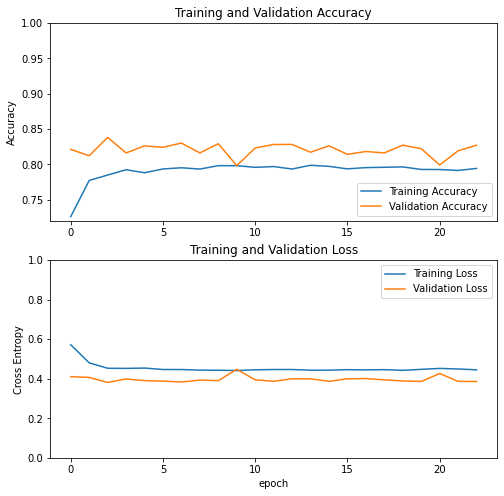

In [ ]:
plot_acc_loss(history)

In [ ]:
# load model from checkpoint with best val loss
resnet = load_model('drive/My Drive/FoodPorn/Models/resnet.h5')

In [ ]:
score = resnet.evaluate(val_dataset, verbose=0)
print(f'Best Validation Loss: {round(score[0], 4)} / Validation Accuracy: {round(score[1], 4)}')

Best Validation Loss: 0.3812 / Validation Accuracy: 0.838


In [ ]:
score = resnet.evaluate(test_dataset, verbose=0)
print(f'Test loss: {round(score[0], 4)} / Test accuracy: {round(score[1], 4)}')

Test loss: 0.3746 / Test accuracy: 0.831


The model saw the lowest loss after only 3 epochs with a validation loss of 0.3812, validation accuracy of 0.8380, test loss of 0.3746, and test accuracy of 0.8310.

## Fine Tuning

After conducting the initial training, its recommended to do a fine tuning by unfreezing some of the transfered model's layers and training again at a low learning rate. I split the model and conducted training with a various number of unfrozen layers to find a more optimal result.

In [ ]:
# get base resent
model = resnet.get_layer('resnet50')

# set model to trainable
model.trainable = True

print(f'Total number of trainable layers: {len(model.trainable_variables)}')

Total number of trainable layers: 212


In [ ]:
for i in range(0, 212, 53):

  resnet = load_model('drive/My Drive/FoodPorn/Models/resnet.h5')

  # get base resent
  model = resnet.get_layer('resnet50')

  # set model to trainable
  model.trainable = True

  # Fine-tune from this layer onwards
  fine_tune_at = i

  # Freeze all the layers before the `fine_tune_at` layer
  for layer in model.layers[:fine_tune_at]:
    layer.trainable =  False

  num_trainable = len(resnet.trainable_variables)

  print(f'Number of layers to train: {num_trainable}')

  # recompile model after changing trainable status
  resnet.compile(optimizer=keras.optimizers.Adam(learning_rate=0.00001), # use very low learning rate
                loss=keras.losses.BinaryCrossentropy(),
                metrics=['accuracy'])

  fine_tune_epochs = 20

  checkpoint_path = f'drive/My Drive/FoodPorn/Models/resnet_finetune_{num_trainable}.h5'
  mc =  keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_loss', verbose=0, save_best_only=True)

  fine_tune_history = resnet.fit(full_train_ds, 
                     epochs=fine_tune_epochs,
                     validation_data=val_dataset,
                     verbose=0,
                     callbacks=mc)
  
  fine_tune_df = pd.DataFrame(fine_tune_history.history)
  fine_tune_df.to_csv(f'drive/My Drive/FoodPorn/Models/finetune{num_trainable}_history.csv')
  
  # load model from checkpoint with best val loss
  fine_tune_resnet = load_model(f'drive/My Drive/FoodPorn/Models/resnet_finetune_{num_trainable}.h5')

  score = fine_tune_resnet.evaluate(val_dataset, verbose=0)
  print(f'Best Validation Loss: {round(score[0], 4)} / Validation Accuracy: {round(score[1], 4)}')
  score = fine_tune_resnet.evaluate(test_dataset, verbose=0)
  print(f'Test Loss: {round(score[0], 4)} / Test Accuracy: {round(score[1], 4)}')

Number of layers to train: 214
Best Validation Loss: 0.3484 / Validation Accuracy: 0.844
Test Loss: 0.2102 / Test Accuracy: 0.914
Number of layers to train: 150
Best Validation Loss: 0.339 / Validation Accuracy: 0.852
Test Loss: 0.1814 / Test Accuracy: 0.937
Number of layers to train: 86
Best Validation Loss: 0.3478 / Validation Accuracy: 0.849
Test Loss: 0.2118 / Test Accuracy: 0.917
Number of layers to train: 20
Best Validation Loss: 0.3687 / Validation Accuracy: 0.834
Test Loss: 0.2368 / Test Accuracy: 0.904


In [ ]:
fine_tune_df = pd.read_csv('drive/My Drive/FoodPorn/Models/finetune150_history.csv')

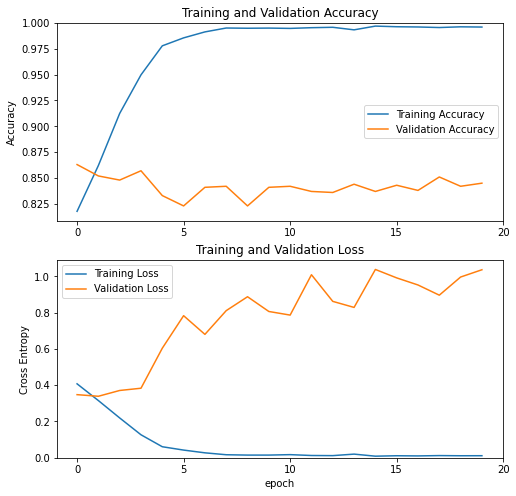

In [ ]:
acc = fine_tune_df['accuracy']
val_acc = fine_tune_df['val_accuracy']

loss = fine_tune_df['loss']
val_loss = fine_tune_df['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='best')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.xticks(np.arange(0,len(acc)+1,5))
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='best')
plt.ylabel('Cross Entropy')
plt.ylim([0,max(plt.ylim())])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.xticks(np.arange(0,len(loss)+1,5))
plt.show()

In [ ]:
# load model from checkpoint with best val loss
fine_tune_resnet = load_model('drive/My Drive/FoodPorn/Models/resnet_finetune_150.h5')

In [ ]:
score = fine_tune_resnet.evaluate(val_dataset, verbose=0)
print(f'Best Validation Loss: {round(score[0], 4)} / Validation Accuracy: {round(score[1], 4)}')

Best Validation Loss: 0.339 / Validation Accuracy: 0.852


In [ ]:
score = fine_tune_resnet.evaluate(test_dataset, verbose=0)
print(f'Test Loss: {round(score[0], 4)} / Test Accuracy: {round(score[1], 4)}')

Test Loss: 0.1814 / Test Accuracy: 0.937


Only two epochs of fine tuning was beneficial, but to great results. Validation loss was reduced to 0.339 and validation accuracy improved to 0.8520. Test accuracy improved from 0.8310 to 0.9370.

# Model Performance

In [ ]:
pred_proba = fine_tune_resnet.predict(test_dataset)

In [ ]:
true_labels = np.concatenate([y for x, y in test_dataset], axis=0)

In [ ]:
precision, recall, thresholds = precision_recall_curve(true_labels, pred_proba)
fpr, tpr, roc_threshold = roc_curve(true_labels, pred_proba)
pr_auc = auc(recall, precision)
roc_auc = roc_auc_score(true_labels, pred_proba)

## ROC Curve & Precision Recall Curve

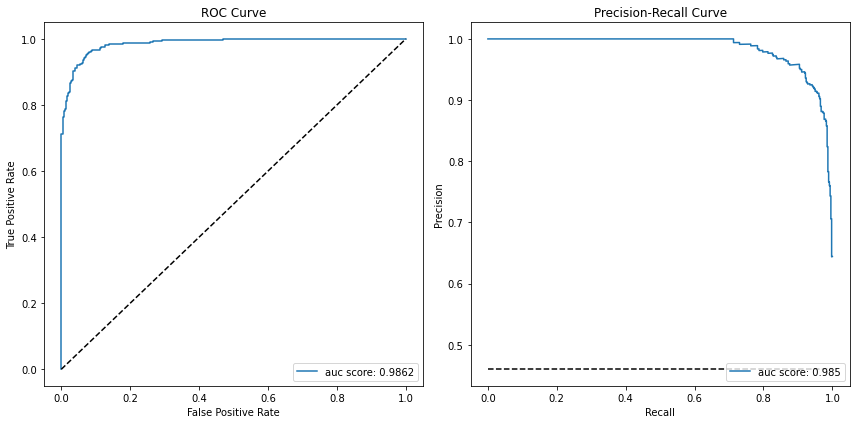

In [ ]:
h_line = len(true_labels[true_labels==1]) / len(true_labels) # no skill line in precision/recall curve

_ = plt.subplots(figsize=(12,6))
f1 = plt.subplot(1,2,1)
_ = plt.plot(fpr, tpr)
_ = plt.plot([0,1],[0,1], 'k--')
_ = plt.xlabel('False Positive Rate')
_ = plt.ylabel('True Positive Rate')
_ = plt.title('ROC Curve')
_ = plt.legend([f'auc score: {round(roc_auc, 4)}'], loc='lower right')

f2 = plt.subplot(1,2,2)
_ = plt.plot(recall, precision)
_ = plt.plot([0, 1], [h_line, h_line], linestyle='--', color='k')
_ = plt.xlabel('Recall')
_ = plt.ylabel('Precision')
_ = plt.title('Precision-Recall Curve')
_ = plt.legend([f'auc score: {round(pr_auc, 4)}'], loc='lower right')

plt.tight_layout()

## Decision Threshold

In choosing the decision threshold for the model I propose two options. The first increases the decision threshold to 0.84 to reach a 1.00 precision at the expense of a 0.71 recall. This model would be for food professionals such as advertisers, authors, or chefs who require assurance that their food photographs are of the best quality. The second model reduces the threshold to 0.46 in order to maximize both precision at 0.91 and recall at 0.96 (effectively maximizing the F1 score). This is for general purpose users such as bloggers or influencers where content creation and volume is more important.

In [ ]:
pred_df = pd.DataFrame({'precision':precision[:-1], 'recall':recall[:-1], 'threshold':thresholds})
pred_df = pred_df.assign(f1 = lambda x : 2 * (x.precision * x.recall) / (x.precision + x.recall))

### Max Precision

In [ ]:
pred_df[pred_df.precision == 1].sort_values(by='recall', ascending=False).head(1)

,precision,recall,threshold,f1
386,1.0,0.713043,0.843535,0.832487


### Maximize F1

In [ ]:
pred_df.sort_values('f1', ascending=False).head(1)

,precision,recall,threshold,f1
229,0.91134,0.96087,0.463529,0.93545


### Thresholds

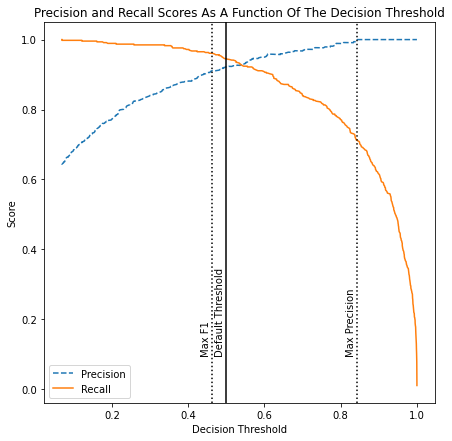

In [ ]:
_ = plt.figure(figsize=(7, 7))
_ = plt.title('Precision and Recall Scores As A Function Of The Decision Threshold')
_ = plt.plot(thresholds, precision[:-1], '--', label='Precision')
_ = plt.plot(thresholds, recall[:-1], '-', label='Recall')
_ = plt.axvline(x=0.5, c='black')
_ = plt.annotate('Default Threshold', xy=(0.47,0.1), rotation=90)
_ = plt.axvline(x=0.463529, c='k', ls=':')
_ = plt.annotate('Max F1', xy=(0.4335,0.1), rotation=90)
_ = plt.axvline(x=0.843535, c='k', ls=':')
_ = plt.annotate('Max Precision', xy=(0.8135,0.1), rotation=90)
_ = plt.ylabel('Score')
_ = plt.xlabel('Decision Threshold')
_ = plt.legend(loc='best')

## Classification Report & Confusion Matrix

In [ ]:
# Adjust the decision thresholds  
maxf1_pred = np.where(pred_proba >= 0.463529, 1, 0)
highpr_pred = np.where(pred_proba >= 0.843535, 1, 0)

In [ ]:
print('Classification Report - Max F1')
print(classification_report(true_labels, maxf1_pred))

Classification Report - Max F1
              precision    recall  f1-score   support

           0       0.97      0.92      0.94       540
           1       0.91      0.96      0.94       460

    accuracy                           0.94      1000
   macro avg       0.94      0.94      0.94      1000
weighted avg       0.94      0.94      0.94      1000



In [ ]:
print('Classification Report - High Precision')
print(classification_report(true_labels, highpr_pred))

Classification Report - High Precision
              precision    recall  f1-score   support

           0       0.80      1.00      0.89       540
           1       1.00      0.71      0.83       460

    accuracy                           0.87      1000
   macro avg       0.90      0.86      0.86      1000
weighted avg       0.89      0.87      0.86      1000



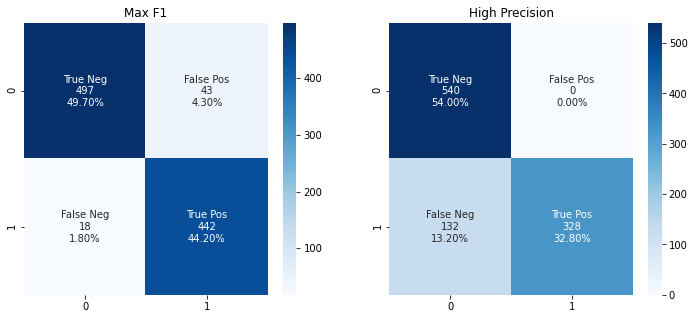

In [ ]:
cmatrix_maxf1 = confusion_matrix(true_labels, maxf1_pred)
cmatrix_highpr = confusion_matrix(true_labels, highpr_pred)

_ = plt.subplots(figsize=(12,5))
_ = plt.subplot(1,2,1)
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ['{0:0.0f}'.format(value) for value in cmatrix_maxf1.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in cmatrix_maxf1.flatten()/np.sum(cmatrix_maxf1)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
_ = sns.heatmap(cmatrix_maxf1, annot=labels, cmap='Blues', fmt='')
_ = plt.title('Max F1')

_ = plt.subplot(1,2,2)
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ['{0:0.0f}'.format(value) for value in cmatrix_highpr.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in cmatrix_highpr.flatten()/np.sum(cmatrix_highpr)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
_ = sns.heatmap(cmatrix_highpr, annot=labels, cmap='Blues', fmt='')
_ = plt.title('High Precision')

## Misclassifications

In [ ]:
# create dataframe of labels and classifications
class_df = pd.DataFrame({'true':true_labels, 'pred': maxf1_pred.ravel(), 'pred_proba': pred_proba[:,0]})
class_df['classification'] = class_df['pred'] - class_df['true']
class_df['classification'].replace({1:'False Positive',0:'Correct',-1:'False Negative'}, inplace=True)

In [ ]:
false_pos = list(class_df[class_df.classification == 'False Positive'].sort_values(by='pred_proba', ascending=False).head(20).index)

In [ ]:
false_neg = list(class_df[class_df.classification == 'False Negative'].sort_values(by='pred_proba', ascending=False).head(20).index)

In [ ]:
ds = np.array(list(test_dataset.unbatch()))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  """Entry point for launching an IPython kernel.


### False Negatives (Incorrectly labeled as not SFP)

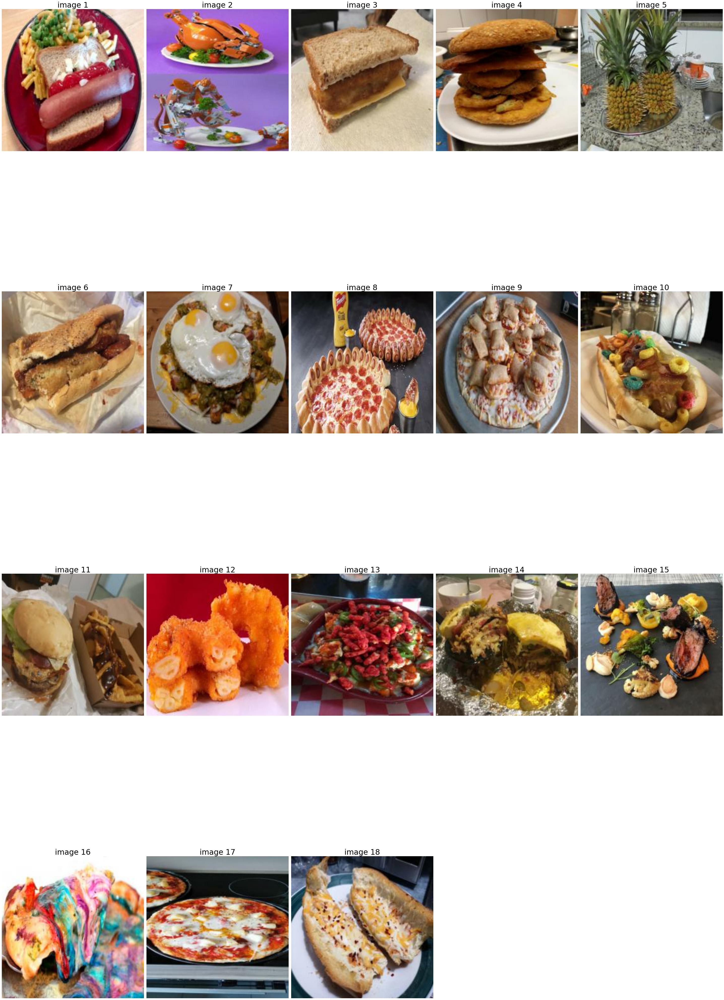

In [ ]:
n = 1
fig = plt.figure(figsize=(40,65))
for idx in false_neg:
  plt.subplot(4,5,n)
  img = np.array(ds[:,0][idx]).astype('int')
  plt.imshow(img)
  plt.axis("off")
  plt.title(f'image {n}', fontsize=30)
  n+=1
plt.tight_layout()

### False Positives (Incorrectly labeled as SFP)

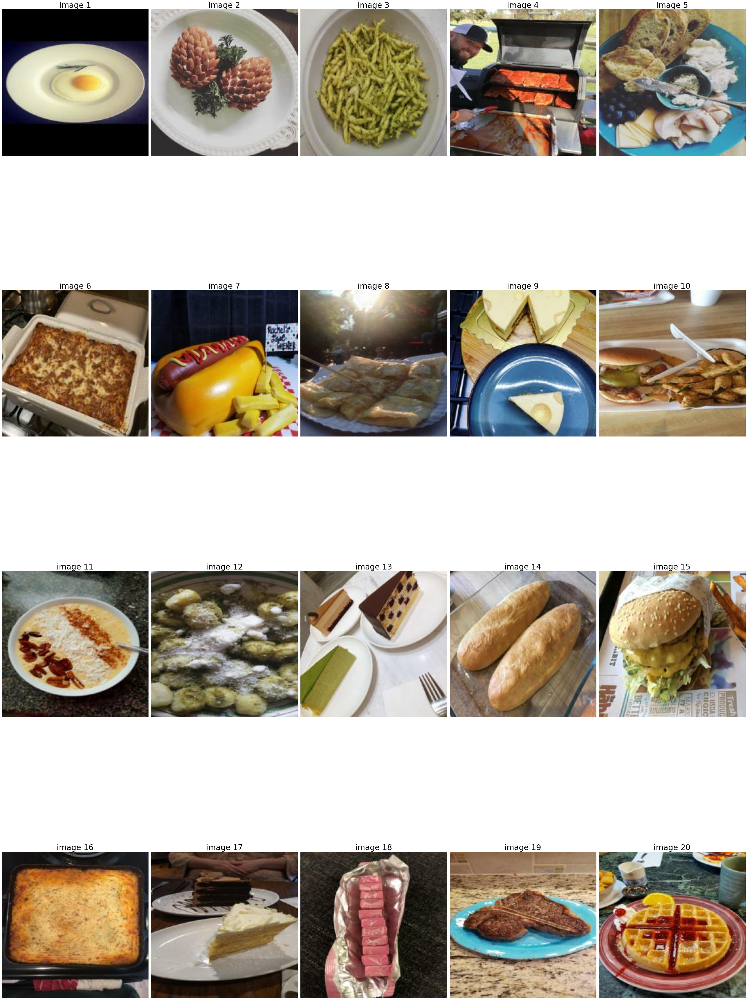

In [ ]:
n = 1
fig = plt.figure(figsize=(40,65))
for idx in false_pos:
  plt.subplot(4,5,n)
  img = np.array(ds[:,0][idx]).astype('int')
  plt.imshow(img)
  plt.axis("off")
  plt.title(f'image {n}', fontsize=30)
  n+=1
plt.tight_layout()

## Class Maximazation


Here I generate an image that maximizes the model prediction for FP or SFP. First I generate a loss function that optimizes a particular class. Then take the gradients of an image of random noise with respect to the loss function, and iteratively add the gradients multiplied by the learning rate to the image.

Code borrowed from https://github.com/dudeperf3ct/DL_notebooks/blob/master/Vis%20CNN/vis_cnn_keras.ipynb

In [ ]:
from keras import backend as K
from tensorflow.python.framework.ops import disable_eager_execution
from skimage import filters

disable_eager_execution()

In [ ]:
fine_tune_resnet = load_model('drive/My Drive/FoodPorn/Models/resnet_finetune_150.h5')
model = fine_tune_resnet

In [ ]:
def build_backprop(model, loss):
    # Gradient of the input image with respect to the loss function
    gradients = K.gradients(loss, model.input)[0]
    # Normalize the gradients
    gradients /= (K.sqrt(K.mean(K.square(gradients))) + 1e-5)
    # Keras function to calculate the gradients and loss
    return K.function([model.input], [loss, gradients])

### SFP Maximization

In [ ]:
# Loss function that optimizes SFP class
SFP_loss_function = K.mean(model.output[:, 0])

# Backprop function
SFP_backprop = build_backprop(model, SFP_loss_function)

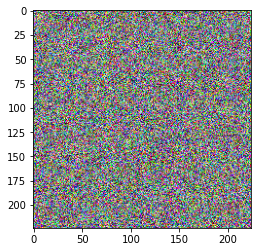

In [ ]:
# Start with a random image
random_image = np.random.random((224, 224, 3))
plt.grid(visible=False)
plt.imshow(random_image)

Loss: 0.8128282
Loss: 0.9988908
Loss: 0.99966776
Loss: 0.999796
Loss: 0.9998542
Loss: 0.9998901


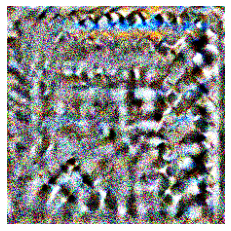

In [ ]:
# Iteratively apply gradient ascent
for i in range(60):
    loss, grads = SFP_backprop([random_image[None]])
    random_image[None] += filters.gaussian(np.clip(grads, -1, 1), 2) 

    # Print loss value
    if i % 10 == 0:
        print('Loss:', loss)

plt.grid(visible=False)  
plt.imshow(np.clip(random_image, 0, 1))
plt.axis("off")
plt.savefig('drive/My Drive/FoodPorn/Visualizations/sfp_maximized.jpg', bbox_inches='tight', pad_inches=0)

In [ ]:
# Classify the image
predictions = model.predict(random_image[None])
predictions

array([[0.9999112]], dtype=float32)

In [ ]:
sfp_max = io.imread('drive/My Drive/FoodPorn/Visualizations/sfp_maximized.jpg')

In [ ]:
# segment color channels
sfp_red = sfp_max[:, :, 0]
sfp_green = sfp_max[:, :, 1]
sfp_blue = sfp_max[:, :, 2]
# intensities
sfp_total_red = np.sum(sfp_red)
sfp_total_green = np.sum(sfp_green)
sfp_total_blue = np.sum(sfp_blue)
sfp_intensity = sfp_total_red + sfp_total_blue + sfp_total_green
# means
sfp_mean_red = np.mean(sfp_red)
sfp_mean_green = np.mean(sfp_green)
sfp_mean_blue = np.mean(sfp_blue)
# standard deviations
sfp_std_red = np.std(sfp_red)
sfp_std_green = np.std(sfp_green)
sfp_std_blue = np.std(sfp_blue)

print(f'intensity: {sfp_intensity}')
print(f'total red: {sfp_total_red}, total green: {sfp_total_green}, total_blue: {sfp_total_blue}')
print(f'mean red: {round(sfp_mean_red,4)}, mean_green: {round(sfp_mean_green,4)}, mean_blue: {round(sfp_mean_blue,4)}')
print(f'std red: {round(sfp_std_red,4)}, std green: {round(sfp_std_green,4)}, std blue: {round(sfp_std_blue,4)}')

intensity: 17912109
total red: 5966976, total green: 5992508, total_blue: 5952625
mean red: 126.717, mean_green: 127.2592, mean_blue: 126.4122
std red: 64.0337, std green: 65.2497, std blue: 68.6446


### FP Maximization

Loss: -0.81460226
Loss: -0.021776104
Loss: -0.00086667313
Loss: -0.00050546695
Loss: -0.0003790556
Loss: -0.00030424036


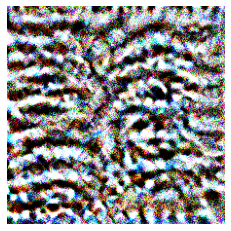

In [ ]:
# Loss function that optimizes FP class
FP_loss_function = -K.mean(model.output[:,0])

# Backprop function
FP_backprop = build_backprop(model, FP_loss_function)

# Start with a random image
random_image = np.random.random((224, 224, 3))
plt.grid(visible=False)
#plt.imshow(random_image)


# Iteratively apply gradient ascent
for i in range(60):
    loss, grads = FP_backprop = build_backprop(model, FP_loss_function)([random_image[None]])
    random_image[None] += filters.gaussian(np.clip(grads, -1, 1), 2) 

    # Print loss value
    if i % 10 == 0:
        print('Loss:', loss)

plt.grid(visible=False)  
plt.imshow(np.clip(random_image, 0, 1))
plt.axis("off")
plt.savefig('drive/My Drive/FoodPorn/Visualizations/fp_maximized.jpg', bbox_inches='tight', pad_inches=0)

In [ ]:
# Classify the image
predictions = model.predict(random_image[None])
predictions

array([[0.00025487]], dtype=float32)

In [ ]:
fp_max = io.imread('drive/My Drive/FoodPorn/Visualizations/fp_maximized.jpg')

In [ ]:
# segment color channels
fp_red = fp_max[:, :, 0]
fp_green = fp_max[:, :, 1]
fp_blue = fp_max[:, :, 2]
# intensities
fp_total_red = np.sum(fp_red)
fp_total_green = np.sum(fp_green)
fp_total_blue = np.sum(fp_blue)
fp_intensity = fp_total_red + fp_total_blue + fp_total_green
# means
fp_mean_red = np.mean(fp_red)
fp_mean_green = np.mean(fp_green)
fp_mean_blue = np.mean(fp_blue)
# standard deviations
fp_std_red = np.std(fp_red)
fp_std_green = np.std(fp_green)
fp_std_blue = np.std(fp_blue)

print(f'intensity: {fp_intensity}')
print(f'total red: {fp_total_red}, total green: {fp_total_green}, total_blue: {fp_total_blue}')
print(f'mean red: {round(fp_mean_red,4)}, mean_green: {round(fp_mean_green,4)}, mean_blue: {round(fp_mean_blue,4)}')
print(f'std red: {round(fp_std_red,4)}, std green: {round(fp_std_green,4)}, std blue: {round(fp_std_blue,4)}')

intensity: 18143194
total red: 6074429, total green: 6028425, total_blue: 6040340
mean red: 128.9989, mean_green: 128.0219, mean_blue: 128.275
std red: 77.7777, std green: 83.0088, std blue: 86.1889


In [ ]:
from scipy import stats

In [ ]:
r_stat, r_p = stats.bartlett(fp_red.ravel(), sfp_red.ravel())
g_stat, g_p = stats.bartlett(fp_green.ravel(), sfp_green.ravel())
bstat, b_p = stats.bartlett(fp_blue.ravel(), sfp_blue.ravel())

print(f'red Bartlett p-value: {r_p}, green Bartlett p-value: {g_p}, blue Bartlett p-value: {b_p}')

red Bartlett p-value: 0.0, green Bartlett p-value: 0.0, blue Bartlett p-value: 0.0


In [ ]:
r_stat, r_p = stats.ttest_ind(fp_red.ravel(), sfp_red.ravel(), equal_var = False)
g_stat, g_p = stats.ttest_ind(fp_green.ravel(), sfp_green.ravel(), equal_var = False)
b_stat, b_p = stats.ttest_ind(fp_blue.ravel(), sfp_blue.ravel(), equal_var = False)

print(f'red t-test p-value: {r_p}, green t-test p-value: {g_p}, blue t-test p-value: {b_p}')

red t-test p-value: 8.891477646956702e-07, green t-test p-value: 0.1169761759751799, blue t-test p-value: 0.00024411400339886333
